In [1]:
from google.colab import drive
drive.mount('/content/gdrive')
!ln -s /content/gdrive/My\ Drive/ /mydrive
%cd /mydrive/Pytorch-Models

Mounted at /content/gdrive
/content/gdrive/.shortcut-targets-by-id/1aJsbt04Jz9xcLP_lg7fvP4Bpdce6GQlC/Pytorch-Models


In [2]:
!python --version

Python 3.12.11


In [ ]:
# --- Step 1: Install Python 3.11 in Colab ---
!sudo apt-get update -y
!sudo apt-get install -y python3.11 python3.11-distutils python3.11-venv

# --- Step 2: Make sure pip for 3.11 exists ---
!curl -sS https://bootstrap.pypa.io/get-pip.py | python3.11

# --- Step 3: Upgrade pip + wheel + setuptools (important for old packages) ---
!python3.11 -m pip install --upgrade pip setuptools wheel certifi

# --- Step 4: Install your packages using Python 3.11 explicitly ---
!python3.11 -m pip install torch==2.0.1 torchvision torchaudio --index-url https://download.pytorch.org/whl/cu117

!git clone https://github.com/open-mmlab/mim.git
%cd mim
!python3.11 -m pip install -e .
%cd ..

!python3.11 -m pip install openmim
!python3.11 -m mim install "mmengine>=0.7.4" \
    "mmcv==2.0.1" "mmdet==3.1.0" --trusted-host download.openmmlab.com

In [4]:
%cd /mydrive/Pytorch-Models

/content/gdrive/.shortcut-targets-by-id/1aJsbt04Jz9xcLP_lg7fvP4Bpdce6GQlC/Pytorch-Models


In [ ]:
# STEP 5: Install MMPose
!git clone https://github.com/open-mmlab/mmpose.git -b v1.1.0
%cd mmpose
!python3.11 -m pip install -e .
%cd ..

In [ ]:
# !pip uninstall -y numpy
# !pip install numpy==1.24.4
!python3.11 -m pip install numpy==1.25.2 scipy==1.11.4 --force-reinstall

In [7]:
%cd mmpose

/content/gdrive/.shortcut-targets-by-id/1aJsbt04Jz9xcLP_lg7fvP4Bpdce6GQlC/Pytorch-Models/mmpose


In [8]:
# STEP 6: Final check
!python3.11 -c "import torch; import mmcv; import mmengine; import mmdet; import mmpose; print('PyTorch:', torch.__version__); print('MMCV:', mmcv.__version__); print('MMEngine:', mmengine.__version__); print('MMDet:', mmdet.__version__); print('MMPose:', mmpose.__version__)"

PyTorch: 2.0.1+cu117
MMCV: 2.0.1
MMEngine: 0.10.7
MMDet: 3.1.0
MMPose: 1.1.0


In [ ]:
!python3.11 -m pip install certifi

In [ ]:
# !mkdir -p /content/gdrive/MyDrive/Pytorch-Models/mmpose/checkpoints/

# !wget -O /content/gdrive/MyDrive/Pytorch-Models/mmpose/checkpoints/td-hm_hrnet-w32_8xb64-210e_ubody-coco-256x192-7c227391_20230807.pth \
# https://download.openmmlab.com/mmpose/v1/wholebody_2d_keypoint/ubody/td-hm_hrnet-w32_8xb64-210e_ubody-coco-256x192-7c227391_20230807.pth

In [ ]:
# !mkdir -p /content/gdrive/MyDrive/Pytorch-Models/mmpose/_base_/schedules
# !mkdir -p /content/gdrive/MyDrive/Pytorch-Models/mmpose/_base_/datasets

# !wget -O /content/gdrive/MyDrive/Pytorch-Models/mmpose/_base_/default_runtime.py https://raw.githubusercontent.com/open-mmlab/mmdetection/v3.0.0/configs/_base_/default_runtime.py

# !wget -O /content/gdrive/MyDrive/Pytorch-Models/mmpose/_base_/schedules/schedule_1x.py https://raw.githubusercontent.com/open-mmlab/mmdetection/v3.0.0/configs/_base_/schedules/schedule_1x.py

# !wget -O /content/gdrive/MyDrive/Pytorch-Models/mmpose/_base_/datasets/coco_detection.py https://raw.githubusercontent.com/open-mmlab/mmdetection/v3.0.0/configs/_base_/datasets/coco_detection.py

# !wget -O /content/gdrive/MyDrive/Pytorch-Models/mmpose/checkpoints/rtmdet_tta.py https://raw.githubusercontent.com/open-mmlab/mmdetection/v3.0.0/configs/rtmdet/rtmdet_tta.py

In [ ]:
# !wget -O checkpoints/rtmdet_m_8xb32-300e_coco.pth https://download.openmmlab.com/mmdetection/v3.0/rtmdet/rtmdet_m_8xb32-300e_coco/rtmdet_m_8xb32-300e_coco_20220719_112220-229f527c.pth
# !wget -O checkpoints/rtmdet_m_8xb32-300e_coco.py https://raw.githubusercontent.com/open-mmlab/mmdetection/v3.0.0/configs/rtmdet/rtmdet_m_8xb32-300e_coco.py

In [ ]:
!ls /content/gdrive/MyDrive/Pytorch-Models/mmpose/checkpoints/

hrnetv2_w18_coco_wholebody_face_256x256-c1ca469b_20210909.pth
hrnetv2_w18_coco_wholebody_hand_256x256-1c028db7_20210908.pth
hrnet_w32_animalpose_256x256-1aa7f075_20210426.pth
rtmdet_l_8xb32-300e_coco.py
rtmdet_m_8xb32-300e_coco.pth
rtmdet_m_8xb32-300e_coco.py
rtmdet_m_excavator.py
rtmdet_s_8xb32-300e_coco.py
rtmdet_tiny_8xb32-300e_coco.pth
rtmdet_tiny_8xb32-300e_coco.py
rtmdet_tiny_excavator.py
rtmdet_tiny_v2_excavator.py
rtmdet_tta.py
rtmpose-l_simcc-body7_pt-body7-halpe26_700e-384x288-734182ce_20230605.pth
td-hm_hrnet-w32_8xb32-300e_animalkingdom_P1-256x256-08bf96cb_20230519.pth
td-hm_hrnet-w32_8xb64-210e_ubody-coco-256x192-7c227391_20230807.pth


In [ ]:
%%writefile infer_hrnet_hand_pose.py
import os
os.environ["MPLBACKEND"] = "agg"

import ssl
ssl._create_default_https_context = ssl._create_unverified_context

from mmdet.apis import init_detector, inference_detector
from mmpose.apis import MMPoseInferencer
from mmengine.structures import InstanceData
import mmcv
import cv2
import matplotlib.pyplot as plt

pose_config = '/content/gdrive/MyDrive/Pytorch-Models/mmpose/configs/hand_2d_keypoint/topdown_heatmap/coco_wholebody_hand/td-hm_hrnetv2-w18_8xb32-210e_coco-wholebody-hand-256x256.py'
pose_checkpoint = '/content/gdrive/MyDrive/Pytorch-Models/mmpose/checkpoints/hrnetv2_w18_coco_wholebody_hand_256x256-1c028db7_20210908.pth'

# --- Input (can be single image or folder) ---
input_path = 'datasets/hand-tests/'   # 'tests/data/coco/000000000785.jpg'
out_folder = 'mmpose_outputs/hrnet_pose_exp1'

# --- Init Inferencer ---
pose_inferencer = MMPoseInferencer(pose2d=pose_config, pose2d_weights=pose_checkpoint)

os.makedirs(out_folder, exist_ok=True)

# --- Collect images ---
if os.path.isdir(input_path):
    img_list = [os.path.join(input_path, f) for f in os.listdir(input_path)
                if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
else:
    img_list = [input_path]

# --- Run inference ---
for img in img_list:
    results_gen = pose_inferencer(
        img,
        det_results=[],   # empty means it will auto-detect persons
        return_vis=True,
        show=False
    )

    for r in results_gen:
        vis_img = r['visualization'][0]
        out_file = os.path.join(out_folder, os.path.basename(img))
        cv2.imwrite(out_file, mmcv.bgr2rgb(vis_img))
        print(f"Saved: {out_file}")

print("✅ Inference + visualization complete")

Writing infer_hrnet_hand_pose.py


In [ ]:
!python3.11 infer_hrnet_hand_pose.py

Loads checkpoint by local backend from path: /content/gdrive/MyDrive/Pytorch-Models/mmpose/checkpoints/hrnetv2_w18_coco_wholebody_hand_256x256-1c028db7_20210908.pth
/content/gdrive/.shortcut-targets-by-id/1aJsbt04Jz9xcLP_lg7fvP4Bpdce6GQlC/Pytorch-Models/mmpose/mmpose/apis/inferencers/base_mmpose_inferencer.py:68: UserWarning: dataset_meta are not saved in the checkpoint's meta data, load via config.
  warnings.warn(
08/25 21:28:03 - mmengine - WARNING - Failed to search registry with scope "mmpose" in the "function" registry tree. As a workaround, the current "function" registry in "mmengine" is used to build instance. This may cause unexpected failure when running the built modules. Please check whether "mmpose" is a correct scope, or whether the registry is initialized.
/usr/local/lib/python3.11/dist-packages/mmengine/visualization/visualizer.py:196: UserWarning: Failed to add <class 'mmengine.visualization.vis_backend.LocalVisBackend'>, please provide the `save_dir` argument.
  warn

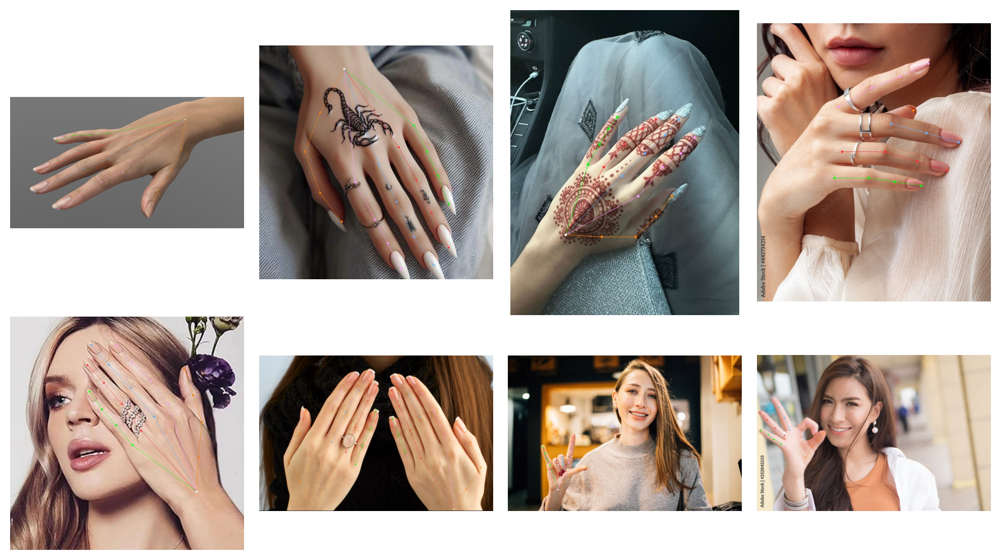

In [42]:
#display inference on ALL test images
import glob
import matplotlib.pyplot as plt
import math
import cv2

# Collect all result images
image_paths = glob.glob('mmpose_outputs/hrnet_pose_exp1/*.jpg')

# Grid config
cols = 4
rows = math.ceil(len(image_paths) / cols)

plt.figure(figsize=(10, 3 * rows), dpi=200)  # higher DPI = sharper

for idx, image_path in enumerate(image_paths):
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    plt.subplot(rows, cols, idx + 1)
    plt.imshow(img)
    plt.axis("off")

plt.tight_layout()
plt.show()

In [ ]:
%%writefile infer_hrnet_face_pose.py
import os
os.environ["MPLBACKEND"] = "agg"

import ssl
ssl._create_default_https_context = ssl._create_unverified_context

from mmdet.apis import init_detector, inference_detector
from mmpose.apis import MMPoseInferencer
from mmengine.structures import InstanceData
import mmcv
import cv2
import matplotlib.pyplot as plt

pose_config = '/content/gdrive/MyDrive/Pytorch-Models/mmpose/configs/face_2d_keypoint/topdown_heatmap/coco_wholebody_face/td-hm_hrnetv2-w18_8xb32-60e_coco-wholebody-face-256x256.py'
pose_checkpoint = '/content/gdrive/MyDrive/Pytorch-Models/mmpose/checkpoints/hrnetv2_w18_coco_wholebody_face_256x256-c1ca469b_20210909.pth'

# --- Input (can be single image or folder) ---
input_path = 'datasets/face-tests/'   # 'tests/data/coco/000000000785.jpg'
out_folder = 'mmpose_outputs/hrnet_pose_exp2'

# --- Init Inferencer ---
pose_inferencer = MMPoseInferencer(pose2d=pose_config, pose2d_weights=pose_checkpoint)

os.makedirs(out_folder, exist_ok=True)

# --- Collect images ---
if os.path.isdir(input_path):
    img_list = [os.path.join(input_path, f) for f in os.listdir(input_path)
                if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
else:
    img_list = [input_path]

# --- Run inference ---
for img in img_list:
    results_gen = pose_inferencer(
        img,
        det_results=[],   # empty means it will auto-detect persons
        return_vis=True,
        show=False
    )

    for r in results_gen:
        vis_img = r['visualization'][0]
        out_file = os.path.join(out_folder, os.path.basename(img))
        cv2.imwrite(out_file, mmcv.bgr2rgb(vis_img))
        print(f"Saved: {out_file}")

print("✅ Inference + visualization complete")

Overwriting infer_hrnet_face_pose.py


In [ ]:
!python3.11 infer_hrnet_face_pose.py

Loads checkpoint by local backend from path: /content/gdrive/MyDrive/Pytorch-Models/mmpose/checkpoints/hrnetv2_w18_coco_wholebody_face_256x256-c1ca469b_20210909.pth
/content/gdrive/.shortcut-targets-by-id/1aJsbt04Jz9xcLP_lg7fvP4Bpdce6GQlC/Pytorch-Models/mmpose/mmpose/apis/inferencers/base_mmpose_inferencer.py:68: UserWarning: dataset_meta are not saved in the checkpoint's meta data, load via config.
  warnings.warn(
08/25 21:42:06 - mmengine - WARNING - Failed to search registry with scope "mmpose" in the "function" registry tree. As a workaround, the current "function" registry in "mmengine" is used to build instance. This may cause unexpected failure when running the built modules. Please check whether "mmpose" is a correct scope, or whether the registry is initialized.
/usr/local/lib/python3.11/dist-packages/mmengine/visualization/visualizer.py:196: UserWarning: Failed to add <class 'mmengine.visualization.vis_backend.LocalVisBackend'>, please provide the `save_dir` argument.
  warn

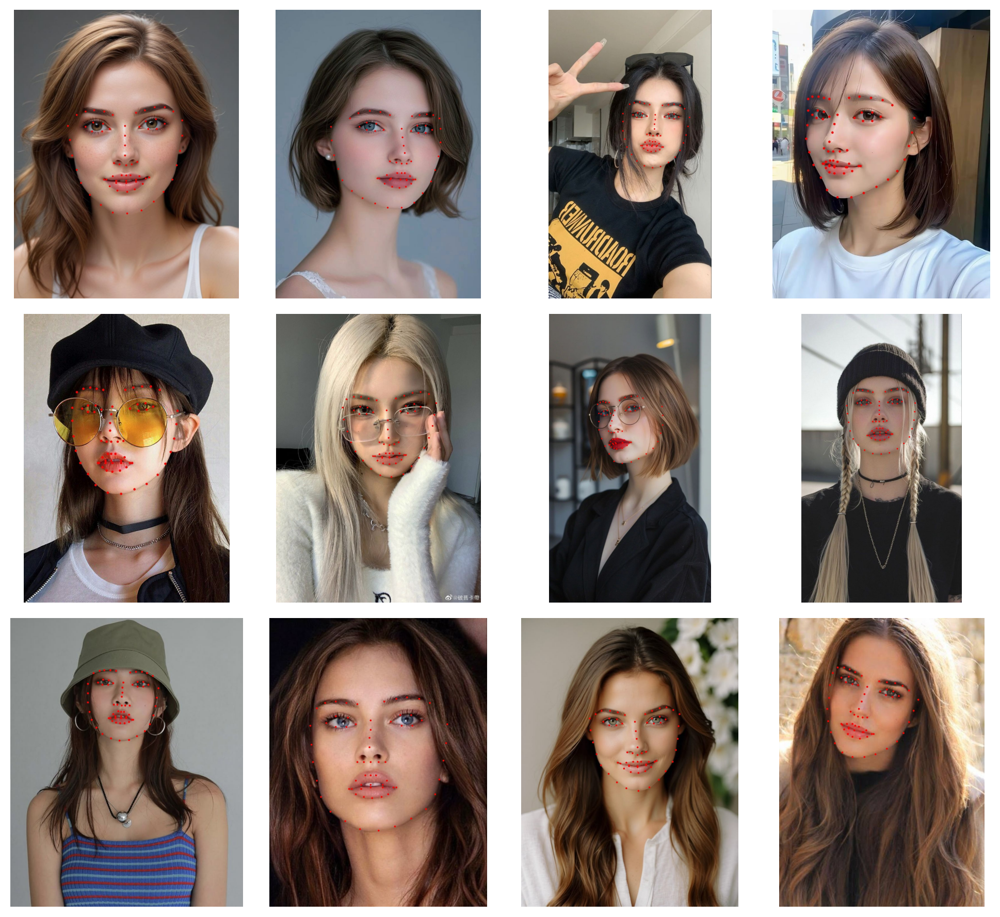

In [41]:
#display inference on ALL test images
import glob
import matplotlib.pyplot as plt
import math
import cv2

# Collect all result images
image_paths = glob.glob('mmpose_outputs/hrnet_pose_exp2/*.jpg')

# Grid config
cols = 4
rows = math.ceil(len(image_paths) / cols)

plt.figure(figsize=(10, 3 * rows), dpi=200)  # higher DPI = sharper

for idx, image_path in enumerate(image_paths):
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    plt.subplot(rows, cols, idx + 1)
    plt.imshow(img)
    plt.axis("off")

plt.tight_layout()
plt.show()

In [ ]:
%%writefile infer_hrnet_halpe26_pose.py
import os
os.environ["MPLBACKEND"] = "agg"

import ssl
ssl._create_default_https_context = ssl._create_unverified_context

from mmdet.apis import init_detector, inference_detector
from mmpose.apis import MMPoseInferencer
from mmengine.structures import InstanceData
import mmcv
import cv2
import matplotlib.pyplot as plt

pose_config = '/content/gdrive/MyDrive/Pytorch-Models/mmpose/configs/body_2d_keypoint/rtmpose/body8/rtmpose-l_8xb512-700e_body8-halpe26-384x288.py'
pose_checkpoint = '/content/gdrive/MyDrive/Pytorch-Models/mmpose/checkpoints/rtmpose-l_simcc-body7_pt-body7-halpe26_700e-384x288-734182ce_20230605.pth'

# --- Input (can be single image or folder) ---
input_path = 'datasets/human-tests/'   # 'tests/data/coco/000000000785.jpg'
out_folder = 'mmpose_outputs/hrnet_pose_exp3'

# --- Init Inferencer ---
pose_inferencer = MMPoseInferencer(pose2d=pose_config, pose2d_weights=pose_checkpoint)

os.makedirs(out_folder, exist_ok=True)

# --- Collect images ---
if os.path.isdir(input_path):
    img_list = [os.path.join(input_path, f) for f in os.listdir(input_path)
                if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
else:
    img_list = [input_path]

# --- Run inference ---
for img in img_list:
    results_gen = pose_inferencer(
        img,
        det_results=[],   # empty means it will auto-detect persons
        return_vis=True,
        show=False
    )

    for r in results_gen:
        vis_img = r['visualization'][0]
        out_file = os.path.join(out_folder, os.path.basename(img))
        cv2.imwrite(out_file, mmcv.bgr2rgb(vis_img))
        print(f"Saved: {out_file}")

print("✅ Inference + visualization complete")

Writing infer_hrnet_halpe26_pose.py


In [ ]:
!python3.11 infer_hrnet_halpe26_pose.py

Loads checkpoint by local backend from path: /content/gdrive/MyDrive/Pytorch-Models/mmpose/checkpoints/rtmpose-l_simcc-body7_pt-body7-halpe26_700e-384x288-734182ce_20230605.pth
08/25 22:00:53 - mmengine - WARNING - Failed to search registry with scope "mmpose" in the "function" registry tree. As a workaround, the current "function" registry in "mmengine" is used to build instance. This may cause unexpected failure when running the built modules. Please check whether "mmpose" is a correct scope, or whether the registry is initialized.
/usr/local/lib/python3.11/dist-packages/mmengine/visualization/visualizer.py:196: UserWarning: Failed to add <class 'mmengine.visualization.vis_backend.LocalVisBackend'>, please provide the `save_dir` argument.
  warnings.warn(f'Failed to add {vis_backend.__class__}, '
Loads checkpoint by http backend from path: https://download.openmmlab.com/mmdetection/v3.0/rtmdet/rtmdet_m_8xb32-300e_coco/rtmdet_m_8xb32-300e_coco_20220719_112220-229f527c.pth
Downloading:

In [ ]:
%%writefile infer_hrnet_animal_pose.py
import os
os.environ["MPLBACKEND"] = "agg"

import ssl
ssl._create_default_https_context = ssl._create_unverified_context

from mmdet.apis import init_detector, inference_detector
from mmpose.apis import MMPoseInferencer
from mmengine.structures import InstanceData
import mmcv
import cv2
import matplotlib.pyplot as plt

# pose_config = '/content/gdrive/MyDrive/Pytorch-Models/mmpose/configs/animal_2d_keypoint/topdown_heatmap/animalpose/td-hm_hrnet-w32_8xb64-210e_animalpose-256x256.py'
# pose_checkpoint = '/content/gdrive/MyDrive/Pytorch-Models/mmpose/checkpoints/hrnet_w32_animalpose_256x256-1aa7f075_20210426.pth'

pose_config = '/content/gdrive/MyDrive/Pytorch-Models/mmpose/configs/animal_2d_keypoint/topdown_heatmap/ak/td-hm_hrnet-w32_8xb32-300e_animalkingdom_P1-256x256.py'
pose_checkpoint = '/content/gdrive/MyDrive/Pytorch-Models/mmpose/checkpoints/td-hm_hrnet-w32_8xb32-300e_animalkingdom_P1-256x256-08bf96cb_20230519.pth'

# --- Input (can be single image or folder) ---
input_path = 'datasets/vitpose_models/'   # 'tests/data/coco/000000000785.jpg'
out_folder = 'mmpose_outputs/hrnet_pose_exp5'

# --- Init Inferencer ---
pose_inferencer = MMPoseInferencer(pose2d=pose_config, pose2d_weights=pose_checkpoint)

os.makedirs(out_folder, exist_ok=True)

# --- Collect images ---
if os.path.isdir(input_path):
    img_list = [os.path.join(input_path, f) for f in os.listdir(input_path)
                if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
else:
    img_list = [input_path]

# --- Run inference ---
for img in img_list:
    results_gen = pose_inferencer(
        img,
        det_results=[],   # empty means it will auto-detect persons
        return_vis=True,
        show=False
    )

    for r in results_gen:
        vis_img = r['visualization'][0]
        out_file = os.path.join(out_folder, os.path.basename(img))
        cv2.imwrite(out_file, mmcv.bgr2rgb(vis_img))
        print(f"Saved: {out_file}")

print("✅ Inference + visualization complete")

Overwriting infer_hrnet_animal_pose.py


In [ ]:
!python3.11 infer_hrnet_animal_pose.py

Loads checkpoint by local backend from path: /content/gdrive/MyDrive/Pytorch-Models/mmpose/checkpoints/td-hm_hrnet-w32_8xb32-300e_animalkingdom_P1-256x256-08bf96cb_20230519.pth
08/26 11:31:01 - mmengine - WARNING - Failed to search registry with scope "mmpose" in the "function" registry tree. As a workaround, the current "function" registry in "mmengine" is used to build instance. This may cause unexpected failure when running the built modules. Please check whether "mmpose" is a correct scope, or whether the registry is initialized.
/usr/local/lib/python3.11/dist-packages/mmengine/visualization/visualizer.py:196: UserWarning: Failed to add <class 'mmengine.visualization.vis_backend.LocalVisBackend'>, please provide the `save_dir` argument.
  warnings.warn(f'Failed to add {vis_backend.__class__}, '
Loads checkpoint by http backend from path: https://download.openmmlab.com/mmdetection/v3.0/rtmdet/rtmdet_m_8xb32-300e_coco/rtmdet_m_8xb32-300e_coco_20220719_112220-229f527c.pth
The model an

In [ ]:
%%writefile infer_hrnet_topdown_halpe26_pose.py
import os
os.environ["MPLBACKEND"] = "agg"

import mmcv
import numpy as np
from mmdet.apis import init_detector, inference_detector
from mmpose.apis import init_model, inference_topdown
from mmpose.registry import VISUALIZERS
from mmengine.config import Config

img_path = 'datasets/vitpose_models/family.jpg'

# Initialize detector
det_config = '/content/gdrive/MyDrive/Pytorch-Models/mmpose/checkpoints/rtmdet_tiny_8xb32-300e_coco.py'
det_checkpoint = '/content/gdrive/MyDrive/Pytorch-Models/mmpose/checkpoints/rtmdet_tiny_8xb32-300e_coco.pth'
det_model = init_detector(det_config, det_checkpoint, device='cuda:0')

pose_config = '/content/gdrive/MyDrive/Pytorch-Models/mmpose/configs/body_2d_keypoint/rtmpose/body8/rtmpose-l_8xb512-700e_body8-halpe26-384x288.py'
pose_checkpoint = '/content/gdrive/MyDrive/Pytorch-Models/mmpose/checkpoints/rtmpose-l_simcc-body7_pt-body7-halpe26_700e-384x288-734182ce_20230605.pth'

# Detect
det_result = inference_detector(det_model, img_path)

person_id = 0  # person class index
pred_instances = det_result.pred_instances

# Extract bbox in [x1, y1, x2, y2] numpy float32 array
bbox_results = []
for i in range(len(pred_instances)):
    score = float(pred_instances.scores[i])
    label = int(pred_instances.labels[i])
    if label == person_id and score > 0.5:
        bbox = pred_instances.bboxes[i].cpu().numpy().astype(np.float32)
        bbox_results.append(bbox)

print(f"✅ Found {len(bbox_results)} valid person boxes")

if len(bbox_results) == 0:
    print("❌ No valid person bboxes to run pose estimation")
else:
    # Init pose model
    pose_model = init_model(pose_config, pose_checkpoint, device='cuda:0')

    # Pose estimation
    pose_results = inference_topdown(pose_model, img_path, bbox_results, bbox_format='xyxy')
    #print(pose_results)

    # Visualizer: build properly
    vis = VISUALIZERS.build(
        dict(
            type='PoseLocalVisualizer',
            vis_backends=[dict(type='LocalVisBackend')],
            name='human_pose'
        )
    )
    vis.set_dataset_meta(pose_model.dataset_meta)

    # Read image and visualize first result
    img = mmcv.imread(img_path)
    vis.set_image(img)
    vis.add_datasample(
        name='result',
        image=img,
        data_sample=pose_results[0],
        draw_gt=False,
        show_kpt_idx=True
    )

    # Save the drawn image
    os.makedirs('mmpose_outputs/hrnet_pose_exp6', exist_ok=True)
    output_file = 'mmpose_outputs/hrnet_pose_exp6/halpe26_pose_result.jpg'
    drawn_img = vis.get_image()  # Get the internally drawn image
    mmcv.imwrite(drawn_img, output_file)
    print(f"✅ Saved visualization to: {output_file}")

print("✅ Inference + visualization complete")

Writing infer_hrnet_topdown_halpe26_pose.py


In [11]:
!python3.11 infer_hrnet_topdown_halpe26_pose.py

Loads checkpoint by local backend from path: /content/gdrive/MyDrive/Pytorch-Models/mmpose/checkpoints/rtmdet_tiny_8xb32-300e_coco.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: data_preprocessor.mean, data_preprocessor.std

/usr/local/lib/python3.11/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3483.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
✅ Found 1 valid person boxes
Loads checkpoint by local backend from path: /content/gdrive/MyDrive/Pytorch-Models/mmpose/checkpoints/rtmpose-l_simcc-body7_pt-body7-halpe26_700e-384x288-734182ce_20230605.pth
/usr/local/lib/python3.11/dist-packages/mmengine/visualization/visualizer.py:196: UserWarning: Failed to add <class 'mmengine.visualization.vis_backend.LocalVisBackend'>, please provide the `save_dir` argument

In [32]:
%%writefile infer_custom_hrnet_topdown_halpe26_pose.py
import os
os.environ["MPLBACKEND"] = "agg"

from mmdet.apis import init_detector, inference_detector
import mmcv
import cv2
import matplotlib.pyplot as plt
import numpy as np
from mmengine.config import Config
from mmpose.apis import init_model, inference_topdown
from mmpose.registry import VISUALIZERS

# Initialize detector
det_config = '/content/gdrive/MyDrive/Pytorch-Models/mmpose/checkpoints/rtmdet_tiny_8xb32-300e_coco.py'
det_checkpoint = '/content/gdrive/MyDrive/Pytorch-Models/mmpose/checkpoints/rtmdet_tiny_8xb32-300e_coco.pth'

pose_config = '/content/gdrive/MyDrive/Pytorch-Models/mmpose/configs/body_2d_keypoint/rtmpose/body8/rtmpose-l_8xb512-700e_body8-halpe26-384x288.py'
pose_checkpoint = '/content/gdrive/MyDrive/Pytorch-Models/mmpose/checkpoints/rtmpose-l_simcc-body7_pt-body7-halpe26_700e-384x288-734182ce_20230605.pth'

upperskeleton = [
    [0, 1], [0, 2],       # Nose to eyes
    [1, 3], [2, 4],       # Eyes to ears
    [3, 5], [4, 6],       # ears to shoulders
    [5, 18], [6, 18],      # Shoulders
    [5, 7], [7, 9],       # Left Arm
    [6, 8], [8, 10],      # Right Arm
]

lowerskeleton = [
    [19, 11], [19, 12],   # Hip
    [11, 13], [13, 15],   # Left Leg
    [12, 14], [14, 16],   # Right Leg
]

bodyskeleton = [
    [18, 19],  # Middle
    [5, 11],  # Left
    [6, 12],  # Right
]

headskeleton = [
    [17, 18],  # Middle
]

footskeleton = [
    [20, 22], [22, 24], [24, 20], [15, 24],   # Left
    [23, 21], [21, 25], [25, 23], [16, 25],   # Right
]

# --- Input (can be single image or folder) ---
input_path = 'datasets/human-tests/'   # 'tests/data/coco/000000000785.jpg'
out_folder = 'mmpose_outputs/hrnet_pose_exp7'

os.makedirs(out_folder, exist_ok=True)

# --- Collect images ---
if os.path.isdir(input_path):
    img_list = [os.path.join(input_path, f) for f in os.listdir(input_path)
                if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
else:
    img_list = [input_path]

# --- Run inference ---
for img in img_list:
    det_model = init_detector(det_config, det_checkpoint, device='cuda:0')
    det_result = inference_detector(det_model, img)

    person_id = 0  # person class index
    pred_instances = det_result.pred_instances

    # Extract bbox in [x1, y1, x2, y2] numpy float32 array
    bbox_results = []
    for i in range(len(pred_instances)):
        score = float(pred_instances.scores[i])
        label = int(pred_instances.labels[i])
        if label == person_id and score > 0.5:
            bbox = pred_instances.bboxes[i].cpu().numpy().astype(np.float32)
            bbox_results.append(bbox)

    print(f"✅ Found {len(bbox_results)} valid person boxes")

    if len(bbox_results) == 0:
        print("❌ No valid person bboxes to run pose estimation")
    else:
        # Init pose model
        pose_model = init_model(pose_config, pose_checkpoint, device='cuda:0')
        # Pose estimation
        pose_results = inference_topdown(pose_model, img, bbox_results, bbox_format='xyxy')
        #print(pose_results)

        if isinstance(img, str):
            vis_img = cv2.imread(img)

        if len(pose_results) == 0:
            pass
        else:
            for pose_result in pose_results:
                keypoints = pose_result.pred_instances.keypoints
                scores = pose_result.pred_instances.keypoint_scores

                # Convert to numpy if needed
                if hasattr(keypoints, 'numpy'):
                    keypoints = keypoints.numpy()
                if hasattr(scores, 'numpy'):
                    scores = scores.numpy()

                keypoints = keypoints[0]
                scores = scores[0]

                for pair in upperskeleton:
                    i, j = pair[0] , pair[1]
                    if i < len(keypoints) and j < len(keypoints):
                        if scores[i] > 0.3 and scores[j] > 0.3:
                            x1, y1 = keypoints[i]
                            x2, y2 = keypoints[j]
                            cv2.line(vis_img, (int(x1), int(y1)), (int(x2), int(y2)), color=(0, 255, 255), thickness=3)

                for pair in lowerskeleton:
                    i, j = pair[0] , pair[1]
                    if i < len(keypoints) and j < len(keypoints):
                        if scores[i] > 0.3 and scores[j] > 0.3:
                            x1, y1 = keypoints[i]
                            x2, y2 = keypoints[j]
                            cv2.line(vis_img, (int(x1), int(y1)), (int(x2), int(y2)), color=(0, 255, 255), thickness=3)

                for pair in bodyskeleton:
                    i, j = pair[0] , pair[1]
                    if i < len(keypoints) and j < len(keypoints):
                        if scores[i] > 0.3 and scores[j] > 0.3:
                            x1, y1 = keypoints[i]
                            x2, y2 = keypoints[j]
                            cv2.line(vis_img, (int(x1), int(y1)), (int(x2), int(y2)), color=(255, 255, 0), thickness=3)

                for pair in headskeleton:
                    i, j = pair[0] , pair[1]
                    if i < len(keypoints) and j < len(keypoints):
                        if scores[i] > 0.3 and scores[j] > 0.3:
                            x1, y1 = keypoints[i]
                            x2, y2 = keypoints[j]
                            cv2.line(vis_img, (int(x1), int(y1)), (int(x2), int(y2)), color=(0, 0, 255), thickness=3)

                for pair in footskeleton:
                    i, j = pair[0] , pair[1]
                    if i < len(keypoints) and j < len(keypoints):
                        if scores[i] > 0.3 and scores[j] > 0.3:
                            x1, y1 = keypoints[i]
                            x2, y2 = keypoints[j]
                            cv2.line(vis_img, (int(x1), int(y1)), (int(x2), int(y2)), color=(0, 255, 0), thickness=3)

                for idx_kp, (x, y) in enumerate(keypoints):
                    v = 2 if scores[idx_kp] > 0.3 else 0
                    if v > 0:
                        x_int, y_int = int(x), int(y)
                        circle_color = (255, 0, 0) if v == 2 else (0, 255, 0)
                        cv2.circle(vis_img, (x_int, y_int), radius=6, color=circle_color, thickness=-1)

    out_file = os.path.join(out_folder, os.path.basename(img))
    cv2.imwrite(out_file, vis_img)
    print(f"Saved: {out_file}")

print("✅ Inference + visualization complete")

Overwriting infer_custom_hrnet_topdown_halpe26_pose.py


In [33]:
!python3.11 infer_custom_hrnet_topdown_halpe26_pose.py

Loads checkpoint by local backend from path: /content/gdrive/MyDrive/Pytorch-Models/mmpose/checkpoints/rtmdet_tiny_8xb32-300e_coco.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: data_preprocessor.mean, data_preprocessor.std

/usr/local/lib/python3.11/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3483.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
✅ Found 1 valid person boxes
Loads checkpoint by local backend from path: /content/gdrive/MyDrive/Pytorch-Models/mmpose/checkpoints/rtmpose-l_simcc-body7_pt-body7-halpe26_700e-384x288-734182ce_20230605.pth
Saved: mmpose_outputs/hrnet_pose_exp7/human (14).jpg
08/26 18:57:22 - mmengine - WARNING - The current default scope "mmpose" is not "mmdet", `init_default_scope` will force set the currentdefault scope to "mm

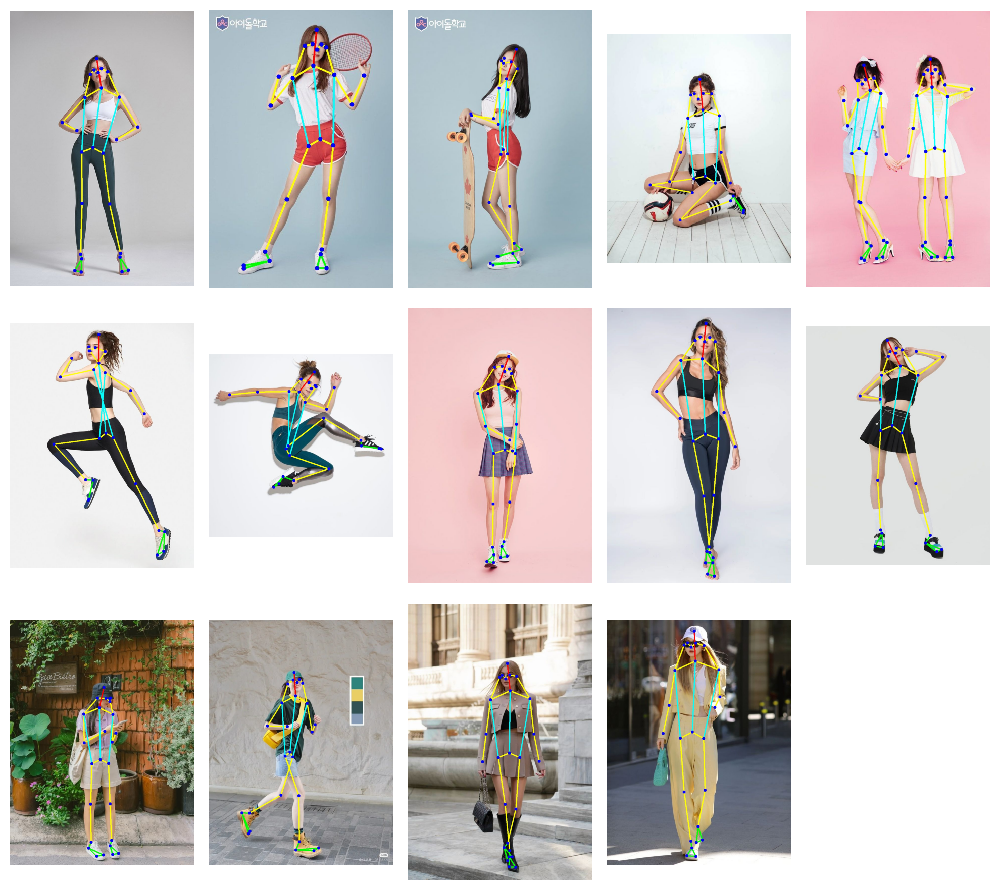

In [40]:
#display inference on ALL test images
import glob
import matplotlib.pyplot as plt
import math
import cv2

# Collect all result images
image_paths = glob.glob('mmpose_outputs/hrnet_pose_exp7/*.jpg')

# Grid config
cols = 5
rows = math.ceil(len(image_paths) / cols)

plt.figure(figsize=(10, 3 * rows), dpi=200)  # higher DPI = sharper

for idx, image_path in enumerate(image_paths):
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    plt.subplot(rows, cols, idx + 1)
    plt.imshow(img)
    plt.axis("off")

plt.tight_layout()
plt.show()